## Telecom Churn Dataset

Dataset: https://www.kaggle.com/datasets/mnassrib/telecom-churn-datasets/data

Context: "Predict behavior to retain customers. You can analyze all relevant customer data and develop focused customer retention programs."

The Orange Telecom's Churn Dataset, which consists of cleaned customer activity data (features), along with a churn label specifying whether a customer canceled the subscription, will be used to develop predictive models. Two datasets are made available here: The churn-80 and churn-20 datasets can be downloaded.

The two sets are from the same batch, but have been split by an 80/20 ratio. As more data is often desirable for developing ML models, let's use the larger set (that is, churn-80) for training and cross-validation purposes, and the smaller set (that is, churn-20) for final testing and model performance evaluation.

## EDA - first look at the data

Each row represents a customer; each column contains customer’s attributes. The datasets have the following attributes or features:

- State: string
- Account length: integer -> The duration of the customer’s relationship with the telecom service provider, measured in months.
- Area code: integer
- International plan: string -> whether the customer has an international plan ("yes" or "no")
- Voice mail plan: string -> whether the customer has voice mail plan ("yes" or "no")
- Number vmail messages: integer -> The number of voicemail messages left by the customer
- Total day minutes: double -> The total number of minutes used during daytime calls
- Total day calls: integer -> The total number of daytime calls made by the customer
- Total day charge: double -> The total charge for daytime calls
- Total eve minutes: double -> The total number of minutes used during evening calls
- Total eve calls: integer -> The total number of evening calls made by the customer
- Total eve charge: double -> The total charge for evening calls
- Total night minutes: double -> The total number of minutes used during night calls
- Total night calls: integer -> The total number of night calls made by the customer
- Total night charge: double -> The total charge for night calls
- Total intl minutes: double -> The total number of minutes used for international calls
- Total intl calls: integer -> The total number of international calls made by the customer
- Total intl charge: double -> The total charge for international calls
- Customer service calls: integer -> The number of calls made by the customer to customer service
- Churn: string ->  Indicates whether the customer has churned ("yes" or "no")

The "Churn" column is the target to predict.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc

In [3]:
df20_test = pd.read_csv("data/churn-bigml-20.csv")
df80_train = pd.read_csv("data/churn-bigml-80.csv")

In [4]:
df20_test.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,LA,117,408,No,No,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False
1,IN,65,415,No,No,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True
2,NY,161,415,No,No,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True
3,SC,111,415,No,No,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,False
4,HI,49,510,No,No,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,False


In [5]:
df80_train.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [6]:
print(f"Number of records - Train: {len(df80_train)}")
print(f"Number of features: {len(df80_train.columns)}")

print(f"Number of records - Test: {len(df20_test)}")

Number of records - Train: 2666
Number of features: 20
Number of records - Test: 667


In [7]:
df80_train.info()

<class 'pandas.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   str    
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   str    
 4   Voice mail plan         2666 non-null   str    
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   float64
 15

In [8]:
df80_train.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [9]:
df80_train.describe(include=object)

C:\Users\lucia\AppData\Local\Temp\ipykernel_32360\1799536612.py:1: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  df80_train.describe(include=object)


,State,International plan,Voice mail plan
count,2666,2666,2666
unique,51,2,2
top,WV,No,No
freq,88,2396,1933


In [10]:
# let's assign them numeric values to categorical variables
df80_train['International plan'] = df80_train['International plan'].map({'No': 0, 'Yes': 1})
df80_train['Voice mail plan'] = df80_train['Voice mail plan'].map({'No': 0, 'Yes': 1})

df20_test['International plan'] = df20_test['International plan'].map({'No': 0, 'Yes': 1})
df20_test['Voice mail plan'] = df20_test['Voice mail plan'].map({'No': 0, 'Yes': 1})

df80_train["Churn"] = df80_train["Churn"].astype(int)
df20_test["Churn"] = df20_test["Churn"].astype(int)

           mean  count
State                 
TX     0.290909     55
NJ     0.280000     50
AR     0.234043     47
MD     0.233333     60
MS     0.229167     48
ME     0.224490     49
SC     0.224490     49
MI     0.224138     58
PA     0.222222     36
NV     0.213115     61
NH     0.209302     43
CA     0.208333     24
WA     0.208333     48
KS     0.192308     52
MT     0.188679     53
CT     0.186441     59
MN     0.185714     70
NY     0.176471     68
GA     0.163265     49
NC     0.160714     56
Chi2: 79.80, p-value: 0.00468


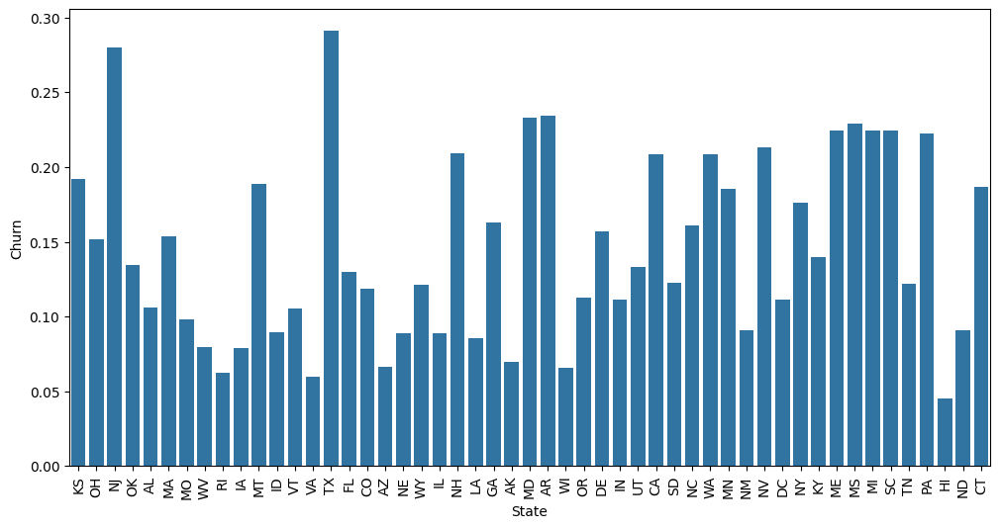

In [11]:
from scipy.stats import mannwhitneyu
from scipy.stats import shapiro
from scipy.stats import chi2_contingency
from scipy.stats import ttest_ind
from scipy.stats import spearmanr
import scipy.stats as stats

# We are observing whether we could drop the State feature. It has a high cardinality

# Do stat test to see if we can safely drop State
# H0: There is no difference in churn between states
# H1: There is a significant difference in churn between states

# 50 states - a lot of categories/ high cardinality

# bar chart of churn rate by state
plt.figure(figsize=(12,6))
sns.barplot(x='State', y='Churn', data=df80_train, errorbar=None)
plt.xticks(rotation=90)

print(df80_train.groupby('State')['Churn'].agg(['mean', 'count']).sort_values('mean', ascending=False).head(20))
# States have reasonable counts

contingency = pd.crosstab(df80_train['State'], df80_train['Churn'])
chi2, p, dof, expected = chi2_contingency(contingency)
print(f"Chi2: {chi2:.2f}, p-value: {p:.5f}")
# p = 0.0047, meaning p < 0.05 - reject null hypothesis
# However, some states are churning more than others (TX, NJ), overall pattern is not very clear or meaningful. We decided to drop the State feature

In [12]:
df80_train = df80_train.drop(["State"], axis=1)
df20_test = df20_test.drop(["State"], axis=1)

In [13]:
df80_train.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [14]:
df20_test.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,117,408,0,0,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,0
1,65,415,0,0,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,1
2,161,415,0,0,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,1
3,111,415,0,0,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,0
4,49,510,0,0,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,0


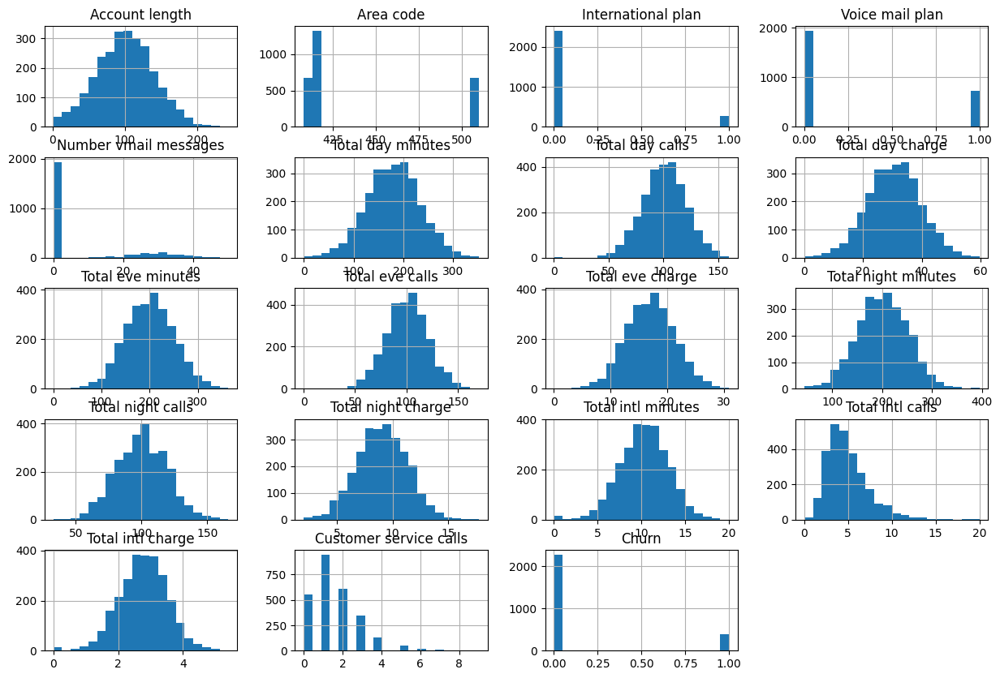

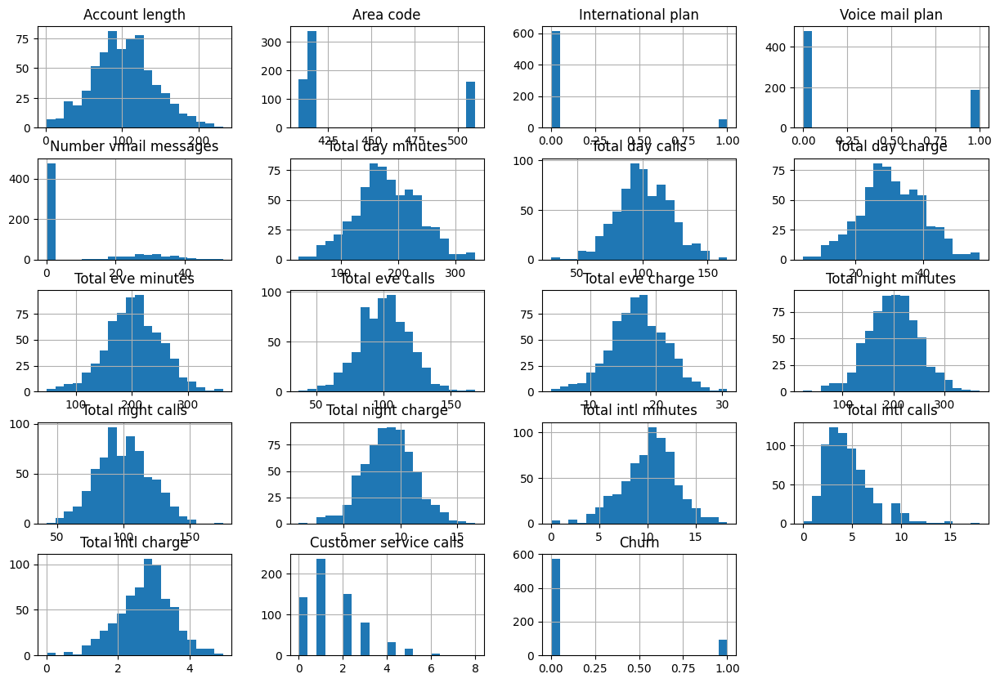

In [15]:
# let's check the distributions in the training and test sets
df80_train.hist(bins=20, figsize=(15, 10))
plt.show()
df20_test.hist(bins=20, figsize=(15, 10))
plt.show()

# seems like the distributions are similar

In [16]:
# there are no missing values
df80_train.isnull().sum()

Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [17]:
df20_test.isnull().sum()

Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

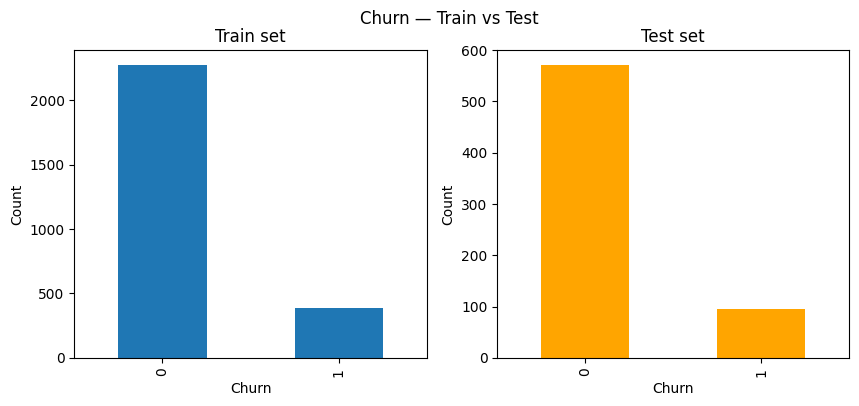

In [18]:
# plot train and test churn next to each other for comparison
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

df80_train["Churn"].value_counts().plot(kind='bar', ax=axes[0])
axes[0].set_title('Train set')
axes[0].set_xlabel('Churn')
axes[0].set_ylabel('Count')

df20_test["Churn"].value_counts().plot(kind='bar', ax=axes[1], color=['orange'])
axes[1].set_title('Test set')
axes[1].set_xlabel('Churn')
axes[1].set_ylabel('Count')

plt.suptitle('Churn — Train vs Test')
plt.show()

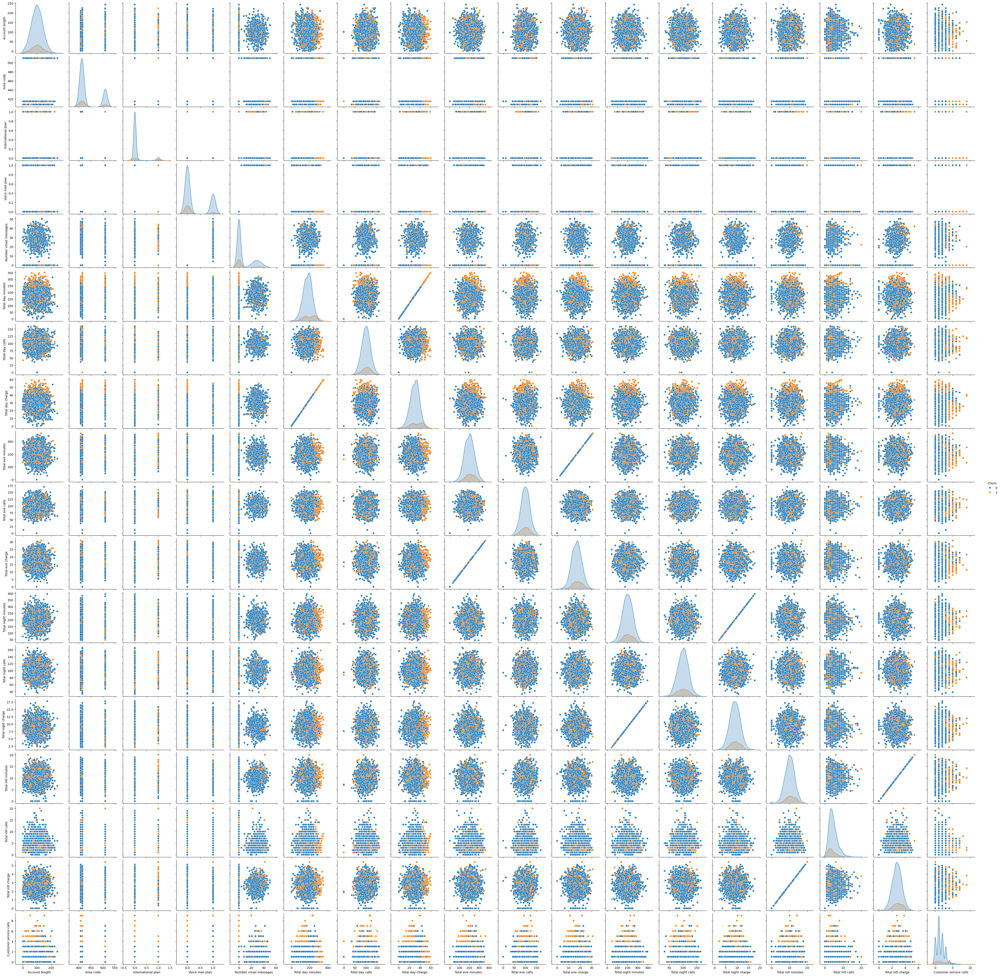

In [19]:
sns.pairplot(df80_train, hue="Churn")

Looking at this pairplot, at the first glance we see that multiple attributes are perfectly correlated - total day charge and total day minutes, and then the same for evenings, nights and international. High minutes = high charge by definition, not an independent signal. This is not good for the model, we will drop one of them later. It also shows that people who call support more often churn more (orange dots). Also, possibly people with international plan churn more. Perhaps people who use the service the most get charged the most, and they also call support before leaving. 

<Axes: xlabel='Customer service calls', ylabel='count'>

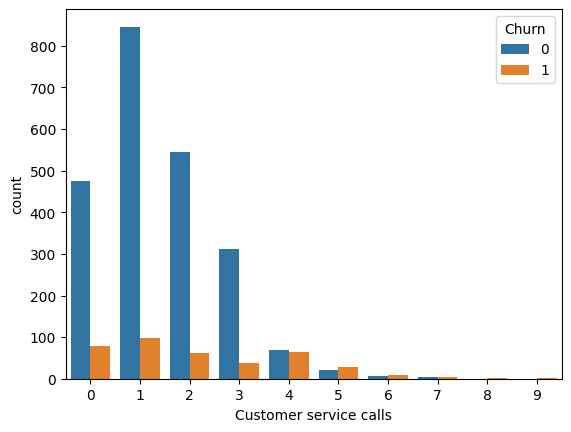

In [20]:
sns.countplot(x='Customer service calls', hue='Churn', data=df80_train)

Customers who call support 4 or more times are much more likely to churn.

A note: The raw counts are misleading because there are far more non-churners than churners overall. 

Text(0.5, 1.0, 'Churn rate by number of customer service calls')

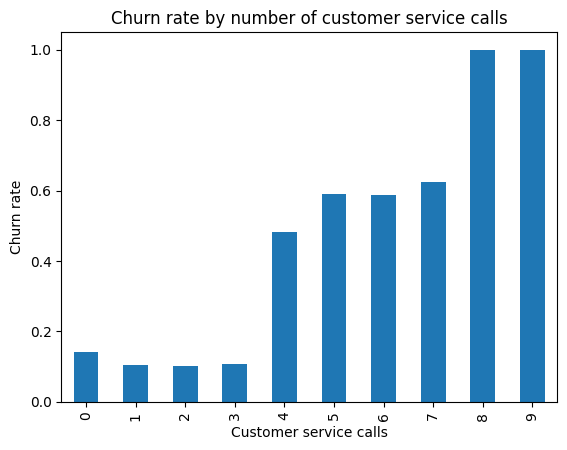

In [21]:
df80_train.groupby('Customer service calls')['Churn'].mean().plot(kind='bar')
plt.ylabel('Churn rate')
plt.title('Churn rate by number of customer service calls')

In [22]:
df80_train.corr()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
Account length,1.000000,-0.008620,0.024500,0.002448,-0.002996,0.002847,0.038862,0.002843,-0.015923,0.018552,-0.015909,-0.008994,-0.024007,-0.008999,0.011369,0.017627,0.011383,0.002455,0.017728
Area code,-0.008620,1.000000,0.047099,0.007180,-0.000584,-0.023134,-0.009629,-0.023130,0.000679,-0.018602,0.000707,-0.003353,0.011455,-0.003382,-0.013418,-0.027423,-0.013534,0.034442,0.001019
International plan,0.024500,0.047099,1.000000,0.002131,0.005858,0.049550,-0.004277,0.049555,0.026616,0.010277,0.026623,-0.010310,0.018081,-0.010316,0.053162,0.011549,0.053037,-0.035955,0.277489
Voice mail plan,0.002448,0.007180,0.002131,1.000000,0.957159,0.013438,-0.007541,0.013439,0.019132,0.003404,0.019147,0.001065,0.013985,0.001066,-0.013963,0.015196,-0.013931,-0.022054,-0.099291
Number vmail messages,-0.002996,-0.000584,0.005858,0.957159,1.000000,0.019027,-0.009622,0.019027,0.011401,0.005131,0.011418,-0.000224,0.008124,-0.000229,-0.004156,0.027013,-0.004136,-0.018787,-0.086474
Total day minutes,0.002847,-0.023134,0.049550,0.013438,0.019027,1.000000,0.016780,1.000000,0.003999,0.009059,0.003992,0.013491,0.015054,0.013464,-0.011042,0.005687,-0.010934,-0.024543,0.195688
Total day calls,0.038862,-0.009629,-0.004277,-0.007541,-0.009622,0.016780,1.000000,0.016787,-0.026003,0.006473,-0.026006,0.008986,-0.016776,0.008972,0.031036,0.006928,0.031133,-0.011945,0.018290
Total day charge,0.002843,-0.023130,0.049555,0.013439,0.019027,1.000000,0.016787,1.000000,0.004008,0.009056,0.004002,0.013495,0.015057,0.013468,-0.011046,0.005688,-0.010938,-0.024548,0.195689
Total eve minutes,-0.015923,0.000679,0.026616,0.019132,0.011401,0.003999,-0.026003,0.004008,1.000000,-0.007654,1.000000,-0.013414,0.009017,-0.013450,-0.006915,0.002160,-0.006947,-0.013192,0.072906
Total eve calls,0.018552,-0.018602,0.010277,0.003404,0.005131,0.009059,0.006473,0.009056,-0.007654,1.000000,-0.007642,-0.000175,0.000797,-0.000135,0.011012,0.003710,0.011000,0.001058,-0.001539


<Axes: >

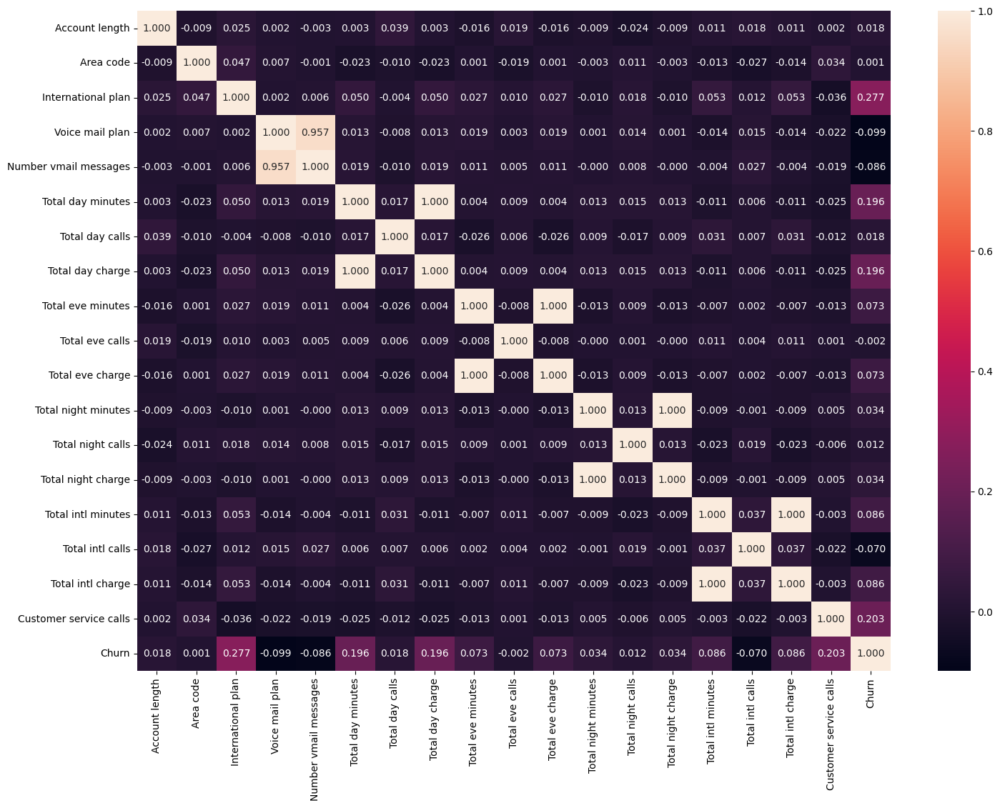

In [23]:
fig, ax = plt.subplots(figsize=(17,12))
sns.heatmap(df80_train.corr(), ax=ax, annot=True, fmt=".3f")

We are seeing:
- Positive correlation **Churn** & **International Plan**
- Positive correlation **Churn** & **Total day minutes**
- Positive correlation **Churn** & **Total day charge**
- Positive correlation **Churn** & **Customer service calls**

Shapiro-Wilk test for churned customers: statistic=0.9020, p-value=0.00000
Shapiro-Wilk test for non-churned customers: statistic=0.8853, p-value=0.00000
Combined Shapiro-Wilk test: statistic=0.8768, p-value=0.00000


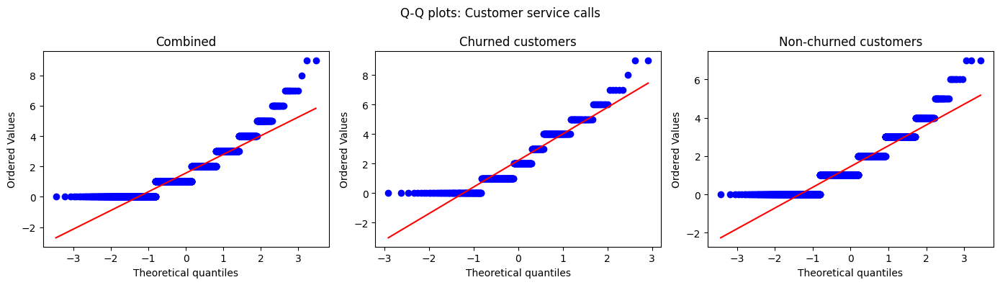

Mann-Whitnery U p-value: 0.00000

Median calls (churned): 2.0
Median calls (not churned): 1.0


In [24]:
# We are seeing correlation between customer service calls and churn. We will check how confident we are (that the difference is not random)
# customer calls are numerical, churn is categorical
# Check Normality (Shapiro-Wilkov + Q-Q plot)
# Based on the results, do t-test or Mann-Whitney

churned = df80_train[df80_train['Churn'] == True]['Customer service calls']
not_churned = df80_train[df80_train['Churn'] == False]['Customer service calls']

# Check Normality
stat1, p1 = shapiro(churned)
stat2, p2 = shapiro(not_churned)

# Combined 
stat3, p = shapiro(df80_train['Customer service calls'])

print(f"Shapiro-Wilk test for churned customers: statistic={stat1:.4f}, p-value={p1:.5f}")
print(f"Shapiro-Wilk test for non-churned customers: statistic={stat2:.4f}, p-value={p2:.5f}")
print(f"Combined Shapiro-Wilk test: statistic={stat3:.4f}, p-value={p:.5f}")

# p < 0.05 → not normal

# Q-Q plot
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

stats.probplot(df80_train['Customer service calls'], plot=axes[0])
axes[0].set_title('Combined')

stats.probplot(churned, plot=axes[1])
axes[1].set_title('Churned customers')

stats.probplot(not_churned, plot=axes[2])
axes[2].set_title('Non-churned customers')

plt.suptitle('Q-Q plots: Customer service calls')
plt.tight_layout()
plt.show()

# Both Shapiro-Wilk and Q-Q plots indicate that the data is not normally distributed. Therefore, we will use the Mann-Whitney U test to compare the two group
stat, p = mannwhitneyu(churned, not_churned, alternative='two-sided')
print(f"Mann-Whitnery U p-value: {p:.5f}")
print(f"\nMedian calls (churned): {churned.median()}")
print(f"Median calls (not churned): {not_churned.median()}")

# p-value < 0.05, reject the null hypothesis. The difference in customer service calls between churners and nonchurners is significant (not due to random chance)
# Median shows that churners make twice as many support calls on average


In [25]:
# let's combine all charges into one feature: Total Charges
df80_train["Total Charges"] = df80_train["Total day charge"] + df80_train["Total eve charge"] + df80_train["Total night charge"] + df80_train["Total intl charge"]

df20_test["Total Charges"] = df20_test["Total day charge"] + df20_test["Total eve charge"] + df20_test["Total night charge"] + df20_test["Total intl charge"]

In [26]:
df80_train.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,Total Charges
0,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0,75.56
1,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,59.24
2,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,62.29
3,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0,66.80
4,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0,52.09


<Axes: >

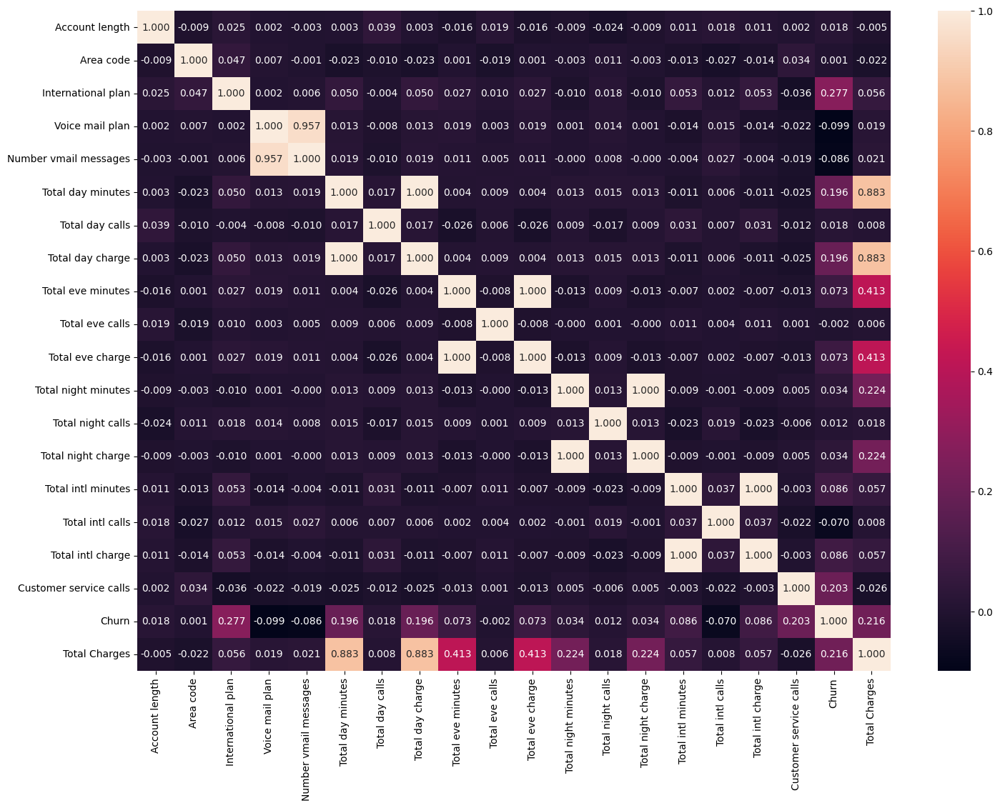

In [27]:
fig, ax = plt.subplots(figsize=(17,12))
sns.heatmap(df80_train.corr(), ax=ax, annot=True, fmt=".3f") # also high correlation between total charges and churn, which makes sense - the more a customer has to pay, the more likely they are to churn

<Axes: xlabel='Churn', ylabel='Total Charges'>

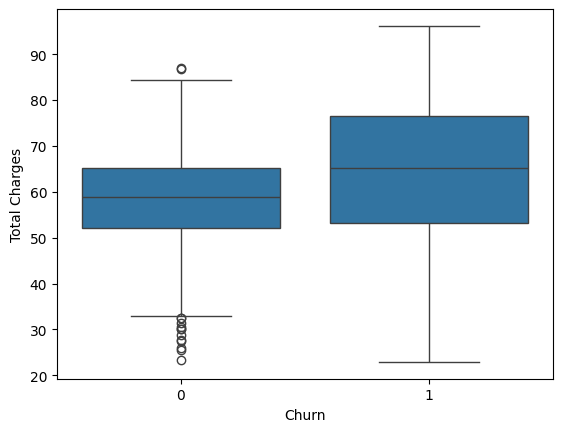

In [28]:
sns.boxplot(data=df80_train, x="Churn", y="Total Charges")
# boxplot shows that customers who churn have higher total charges on average

Shapiro-Wilk test for churned customers: statistic=0.9572, p-value=0.00000
Shapiro-Wilk test for non-churned customers: statistic=0.9913, p-value=0.00000


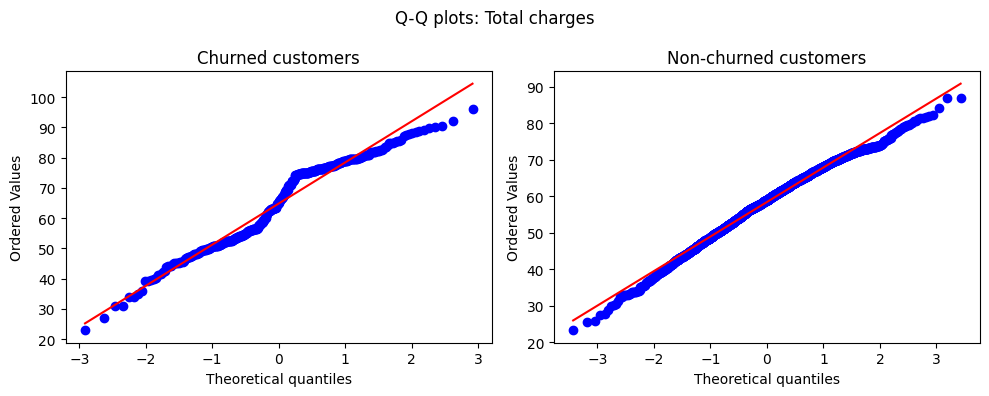

Mann-Whitnery U p-value: 0.00000
T-test p-value: 0.00000
Median total charges (churned): 65.22
Median total charges (not churned): 58.90


In [29]:
# Test for Churn and Total Charges

total_charges_churned = df80_train[df80_train['Churn'] == True]['Total Charges']
total_charges_not_churned = df80_train[df80_train['Churn'] == False]['Total Charges']

stat1, p1 = shapiro(total_charges_churned)
stat2, p2 = shapiro(total_charges_not_churned)

print(f"Shapiro-Wilk test for churned customers: statistic={stat1:.4f}, p-value={p1:.5f}")
print(f"Shapiro-Wilk test for non-churned customers: statistic={stat2:.4f}, p-value={p2:.5f}")

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
stats.probplot(total_charges_churned, plot=axes[0])
axes[0].set_title('Churned customers')
stats.probplot(total_charges_not_churned, plot=axes[1])
axes[1].set_title('Non-churned customers')
plt.suptitle('Q-Q plots: Total charges')
plt.tight_layout()
plt.show()

# because p < 0.05, use Mann-Whitney U test
stat, p = mannwhitneyu(total_charges_churned, total_charges_not_churned, alternative='two-sided')
print(f"Mann-Whitnery U p-value: {p:.5f}")

# T-test just in case, because QQ plot looks normal enough? Sort of
stat, p = ttest_ind(total_charges_churned, total_charges_not_churned)
print(f"T-test p-value: {p:.5f}")

print(f"Median total charges (churned): {total_charges_churned.median():.2f}")
print(f"Median total charges (not churned): {total_charges_not_churned.median():.2f}")

In [30]:
# Check effect size, Customer service calls VS Total Charges
# Use rank correlation/Spearman
r1, p1 = spearmanr(df80_train['Customer service calls'], df80_train['Churn'])
r2, p2 = spearmanr(df80_train['Total Charges'], df80_train['Churn'])

print(f"Customer service calls vs Churn: r={r1:.3f}, p={p1:.5f}")
print(f"Total charges vs Churn:          r={r2:.3f}, p={p2:.5f}")
 
 # Total charges is stronger signal, but both are small effect sizes 

Customer service calls vs Churn: r=0.126, p=0.00000
Total charges vs Churn:          r=0.170, p=0.00000


Churn is not driven by one single dominant factor — it's a combination of signals. No single feature has a strong enough relationship with churn to predict it reliably alone. In fact, this is why we use machine learning models.

Getting data ready for classification

We want to predict customers who are likely to churn (so Churn is our target variable). Classification predicts categories e.g. churn/no churn.

Some popular classification algorithms are:
- Random forest
- KNN
- Logistic regression (despite its name)
- Support Vector Machine (SVM)
- and many more

In [31]:
# drop total day minutes, total eve minutes, total night minutes, total intl minutes, since they had 100% correlation
df80_train = df80_train.drop(columns=["Total day minutes", "Total eve minutes", "Total night minutes", "Total intl minutes"])
df20_test = df20_test.drop(columns=["Total day minutes", "Total eve minutes", "Total night minutes", "Total intl minutes"])

In [32]:
df80_train.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn,Total Charges
0,128,415,0,1,25,110,45.07,99,16.78,91,11.01,3,2.70,1,0,75.56
1,107,415,0,1,26,123,27.47,103,16.62,103,11.45,3,3.70,1,0,59.24
2,137,415,0,0,0,114,41.38,110,10.30,104,7.32,5,3.29,0,0,62.29
3,84,408,1,0,0,71,50.90,88,5.26,89,8.86,7,1.78,2,0,66.80
4,75,415,1,0,0,113,28.34,122,12.61,121,8.41,3,2.73,3,0,52.09


In [33]:
df20_test.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn,Total Charges
0,117,408,0,0,0,97,31.37,80,29.89,90,9.71,4,2.35,1,0,73.32
1,65,415,0,0,0,137,21.95,83,19.42,111,9.40,6,3.43,4,1,54.20
2,161,415,0,0,0,67,56.59,97,27.01,128,7.23,9,1.46,4,1,92.29
3,111,415,0,0,0,103,18.77,102,11.67,105,8.53,6,2.08,2,0,41.05
4,49,510,0,0,0,117,20.28,109,18.28,90,8.04,1,3.00,1,0,49.60


In [34]:
X_train = df80_train.drop(columns=["Churn"])
y_train = df80_train["Churn"]
X_test = df20_test.drop(columns=["Churn"])
y_test = df20_test["Churn"]

In [35]:
def plot_metrics(y_test, y_pred, y_pred_proba=None, model_name="Model"):
    cm_lr = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_lr)
    disp.plot()

    print(f"\nClassification report for {model_name}:\n", classification_report(y_test, y_pred))

    # Calculate ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba) 
    roc_auc = auc(fpr, tpr)
    # Plot the ROC curve
    plt.figure()  
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Churn Prediction')
    plt.legend()
    plt.show()

    # Youden's J statistic = TPR - FPR (Sensitivity + Specificity - 1)
    j_scores = tpr - fpr
    best_idx = j_scores.argmax()
    best_threshold = thresholds[best_idx]

    print(f"Best threshold (Youden's J): {best_threshold:.3f}")
    print(f"At this point — TPR: {tpr[best_idx]:.3f}, FPR: {fpr[best_idx]:.3f}")
    print(f"J statistic: {j_scores[best_idx]:.3f}")
    
    y_pred_optimal = (y_pred_proba >= best_threshold).astype(int)
    print(f"\nClassification report for {model_name} (Optimal Threshold):\n", classification_report(y_test, y_pred_optimal))

### Logistic Regression


Classification report for Logistic Regression:
               precision    recall  f1-score   support

           0       0.87      0.98      0.92       572
           1       0.52      0.16      0.24        95

    accuracy                           0.86       667
   macro avg       0.70      0.57      0.58       667
weighted avg       0.82      0.86      0.83       667



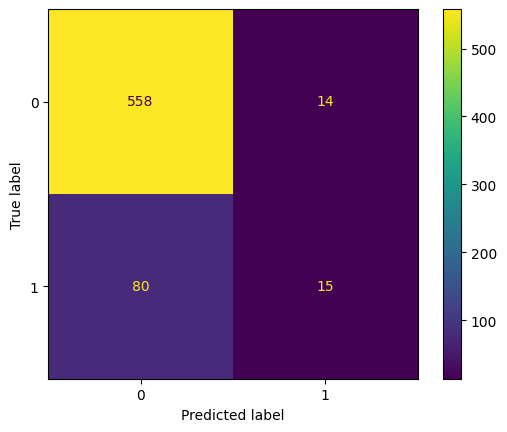

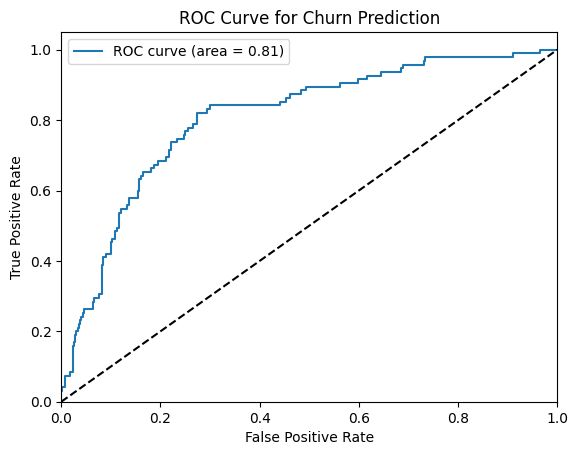

Best threshold (Youden's J): 0.137
At this point — TPR: 0.821, FPR: 0.274
J statistic: 0.547

Classification report for Logistic Regression (Optimal Threshold):
               precision    recall  f1-score   support

           0       0.96      0.73      0.83       572
           1       0.33      0.82      0.47        95

    accuracy                           0.74       667
   macro avg       0.65      0.77      0.65       667
weighted avg       0.87      0.74      0.78       667



In [36]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(max_iter=100, solver='liblinear')
lr.fit(X_train, y_train)

y_pred_lr = lr.predict(X_test)

y_pred_proba_lr = lr.predict_proba(X_test)[:, 1]  # Get the probabilities for the positive class
plot_metrics(y_test, y_pred_lr, y_pred_proba_lr, "Logistic Regression")


The ROC curve is created by plotting the true positive rate (TPR) against the false positive rate (FPR) at various threshold settings. - Youden Index. Use Youden index to determine the optimal cut‐off if the cost of FN=FP. (Otherwise, use your gut feeling.) The area under the ROC curve (AUC) is a common metric used to quantify the overall performance of a classification model. An AUC of 1 represents a perfect model, while an AUC of 0.5 represents a model that is no better than random guessing.

Best threshold (Youden's J): 0.137

This means: instead of using the default 0.5 cutoff to classify someone as "will churn", use 0.137. If model predicts a probability of churn ≥ 0.137, classify them as "will churn". This is a much lower bar than 0.5.
Why so low? Because churn is imbalanced — far fewer people churn than don't. The model rarely predicts probabilities above 0.5 for anyone, even actual churners, because churners are the minority class. Lowering the threshold catches more of them.

TPR: 0.821

**True Positive Rate** (= Recall = Sensitivity)

→ **Of all the customers who actually churned, correctly caught 82.1% of them at this threshold.**

FPR: 0.274

**False Positive Rate**

→ **Of all the customers who did NOT churn, incorrectly flagged 27.4% of them as "will churn" anyway.**

J statistic: 0.547 → TPR − FPR = 0.821 − 0.274 = 0.547

→ The higher this number, the better the threshold separates churners from non-churners. Max possible is 1.0 (perfect), 0 means no better than random.

In other words:
"I'd rather flag some loyal customers by mistake (false positives) if it means catching most of the people who are actually going to leave."
This makes business sense for churn - a false positive just means you send a retention offer to someone who wasn't going to leave anyway, but a false negative means you lose a customer you could have saved (which is worse). 
Also think of it as: "This person's risk score is high enough, relative to everyone else, that we should flag them for retention outreach."

### Random Forest


Classification report for Random Forest Classifier:
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       572
           1       1.00      0.85      0.92        95

    accuracy                           0.98       667
   macro avg       0.99      0.93      0.95       667
weighted avg       0.98      0.98      0.98       667



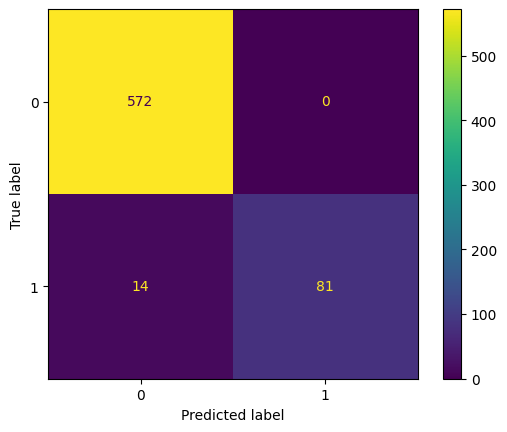

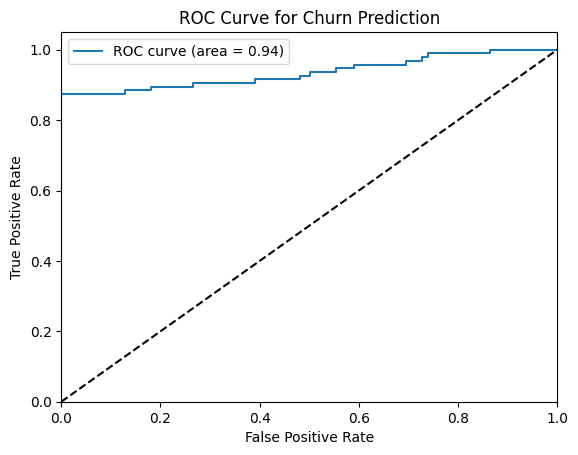

Best threshold (Youden's J): 0.451
At this point — TPR: 0.874, FPR: 0.000
J statistic: 0.874

Classification report for Random Forest Classifier (Optimal Threshold):
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       572
           1       1.00      0.87      0.93        95

    accuracy                           0.98       667
   macro avg       0.99      0.94      0.96       667
weighted avg       0.98      0.98      0.98       667

Accuracy: 0.98


In [37]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

rf = RandomForestClassifier(n_estimators = 100, random_state = 123, max_depth = 9, criterion = "gini") 
rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)

y_pred_proba_rf = rf.predict_proba(X_test)[:, 1]  # Get the probabilities for the positive class
plot_metrics(y_test, y_pred_rf, y_pred_proba_rf, "Random Forest Classifier")
print(f"Accuracy: {round(accuracy_score(y_pred_rf, y_test), 2)}")


Classification report for Decision Tree Classifier:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99       572
           1       0.97      0.87      0.92        95

    accuracy                           0.98       667
   macro avg       0.97      0.93      0.95       667
weighted avg       0.98      0.98      0.98       667



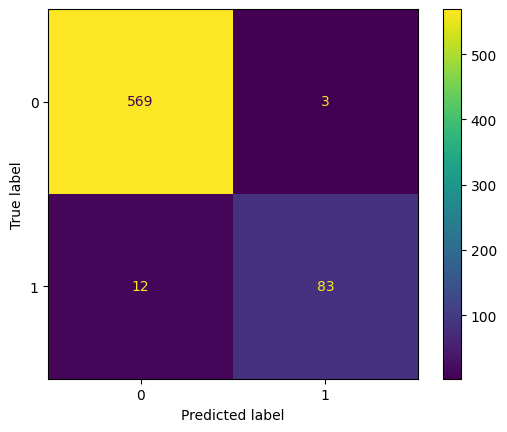

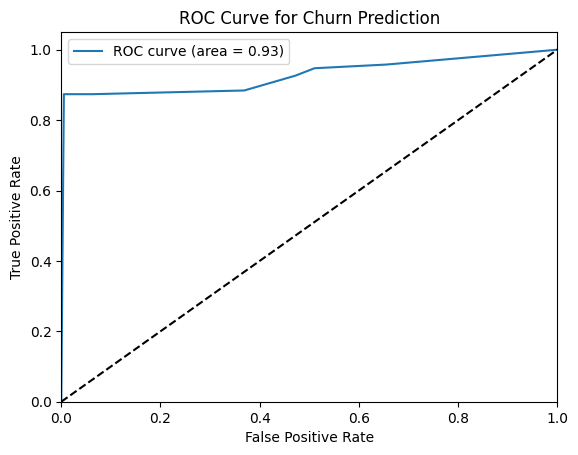

Best threshold (Youden's J): 1.000
At this point — TPR: 0.874, FPR: 0.005
J statistic: 0.868

Classification report for Decision Tree Classifier (Optimal Threshold):
               precision    recall  f1-score   support

           0       0.98      0.99      0.99       572
           1       0.97      0.87      0.92        95

    accuracy                           0.98       667
   macro avg       0.97      0.93      0.95       667
weighted avg       0.98      0.98      0.98       667



In [38]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=123, max_depth=9, splitter='best', min_samples_split=2, min_samples_leaf=1)
dt.fit(X_train, y_train)

y_pred_dt = dt.predict(X_test)

y_pred_proba_dt = dt.predict_proba(X_test)[:, 1]  # Get the probabilities for the positive class
plot_metrics(y_test, y_pred_dt, y_pred_proba_dt, "Decision Tree Classifier")

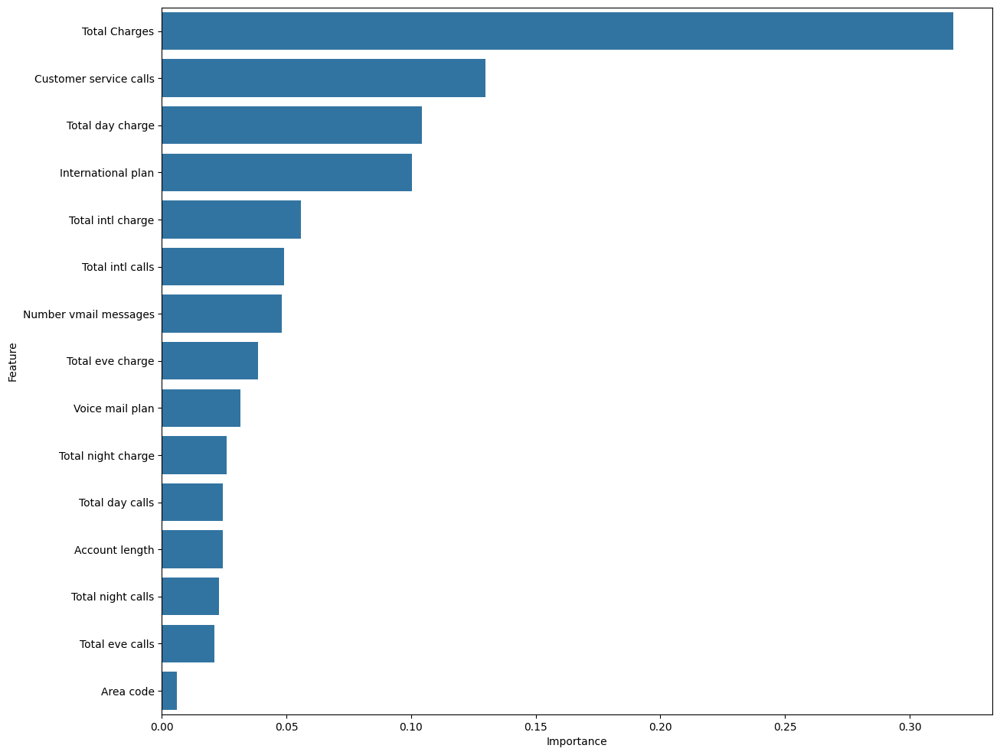

In [39]:
importances = rf.feature_importances_
feature_names = X_train.columns

importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

importance_df

plt.figure(figsize=(14, 12))

sns.barplot(x="Importance", y="Feature", data=importance_df)
plt.show()

# Full circle moment XD

KNN


Classification report for K-Nearest Neighbors Classifier:
               precision    recall  f1-score   support

           0       0.88      0.99      0.93       572
           1       0.70      0.17      0.27        95

    accuracy                           0.87       667
   macro avg       0.79      0.58      0.60       667
weighted avg       0.85      0.87      0.84       667



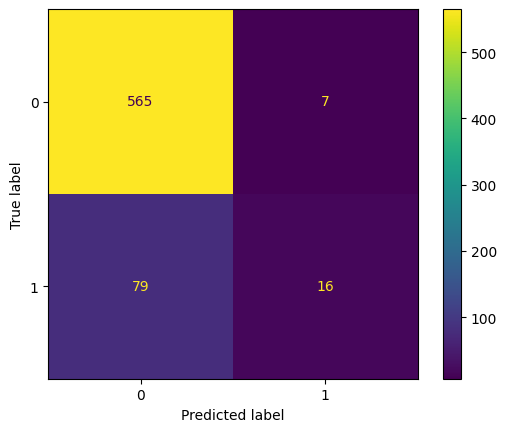

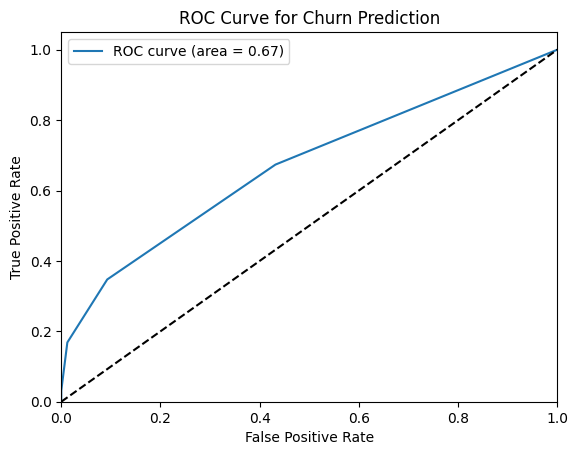

Best threshold (Youden's J): 0.400
At this point — TPR: 0.347, FPR: 0.093
J statistic: 0.255

Classification report for K-Nearest Neighbors Classifier (Optimal Threshold):
               precision    recall  f1-score   support

           0       0.89      0.91      0.90       572
           1       0.38      0.35      0.36        95

    accuracy                           0.83       667
   macro avg       0.64      0.63      0.63       667
weighted avg       0.82      0.83      0.82       667



In [40]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5, weights='uniform', algorithm='auto', p=2, metric='minkowski', metric_params=None, n_jobs=None)
knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)

y_pred_proba_knn = knn.predict_proba(X_test)[:, 1]  # Get the probabilities for the positive class
plot_metrics(y_test, y_pred_knn, y_pred_proba_knn, "K-Nearest Neighbors Classifier")


SVM

c:\Users\lucia\Documents\coding stuff\data_analysis\venv\Lib\site-packages\sklearn\svm\_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(



Classification report for Support Vector Machine:
               precision    recall  f1-score   support

           0       0.86      1.00      0.92       572
           1       0.00      0.00      0.00        95

    accuracy                           0.86       667
   macro avg       0.43      0.50      0.46       667
weighted avg       0.74      0.86      0.79       667



c:\Users\lucia\Documents\coding stuff\data_analysis\venv\Lib\site-packages\sklearn\metrics\_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\lucia\Documents\coding stuff\data_analysis\venv\Lib\site-packages\sklearn\metrics\_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\lucia\Documents\coding stuff\data_analysis\venv\Lib\site-packages\sklearn\metrics\_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_p

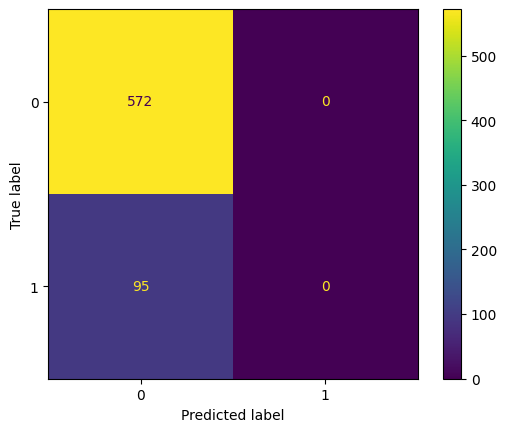

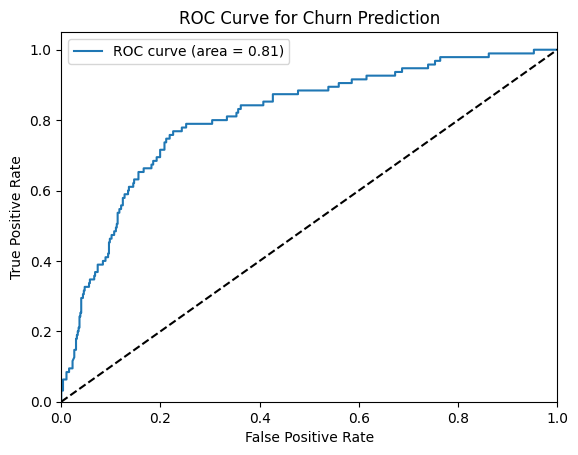

Best threshold (Youden's J): 0.140
At this point — TPR: 0.768, FPR: 0.226
J statistic: 0.543

Classification report for Support Vector Machine (Optimal Threshold):
               precision    recall  f1-score   support

           0       0.95      0.77      0.85       572
           1       0.36      0.77      0.49        95

    accuracy                           0.77       667
   macro avg       0.66      0.77      0.67       667
weighted avg       0.87      0.77      0.80       667



In [41]:
from sklearn.svm import SVC

svm = SVC(C=1.0, kernel='linear', probability=True, random_state=124)
svm.fit(X_train, y_train)

y_pred_svm = svm.predict(X_test)

y_pred_proba_svm = svm.predict_proba(X_test)[:, 1]  # Get the probabilities for the positive class
plot_metrics(y_test, y_pred_svm, y_pred_proba_svm, "Support Vector Machine")

### Compare model results

In [42]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc

models = {
    "Logistic Regression": (y_pred_lr, y_pred_proba_lr),
    "Random Forest": (y_pred_rf, y_pred_proba_rf),
    "Decision Tree": (y_pred_dt, y_pred_proba_dt),
    "K-Nearest Neighbors": (y_pred_knn, y_pred_proba_knn),
    "Support Vector Machine": (y_pred_svm, y_pred_proba_svm)
}

results = []

for name, (y_pred, y_pred_proba) in models.items():
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    
    results.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1 Score": f1_score(y_test, y_pred),
        "ROC AUC": roc_auc
    })

results_df = pd.DataFrame(results).set_index("Model")
results_df = results_df.round(2)
results_df

# SVM initially terrible recall but perfect precision - let's try feature scaling


c:\Users\lucia\Documents\coding stuff\data_analysis\venv\Lib\site-packages\sklearn\metrics\_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


,Accuracy,Precision,Recall,F1 Score,ROC AUC
Model,,,,,
Logistic Regression,0.86,0.52,0.16,0.24,0.81
Random Forest,0.98,1.00,0.85,0.92,0.94
Decision Tree,0.98,0.97,0.87,0.92,0.93
K-Nearest Neighbors,0.87,0.70,0.17,0.27,0.67
Support Vector Machine,0.86,0.00,0.00,0.00,0.81


We'll try to scale for SVM, since it's performing so poorly

c:\Users\lucia\Documents\coding stuff\data_analysis\venv\Lib\site-packages\sklearn\svm\_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(



Classification report for Support Vector Machine (Scaled):
               precision    recall  f1-score   support

           0       0.96      0.91      0.94       572
           1       0.59      0.80      0.68        95

    accuracy                           0.89       667
   macro avg       0.78      0.85      0.81       667
weighted avg       0.91      0.89      0.90       667



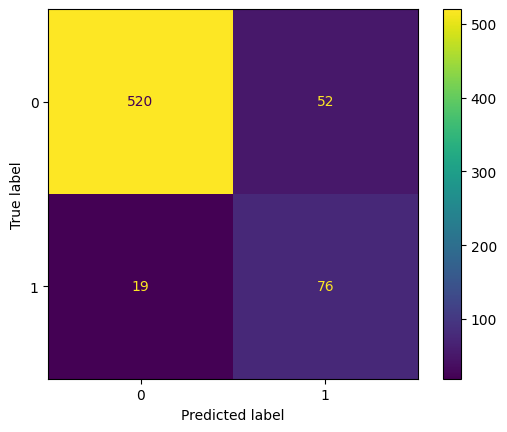

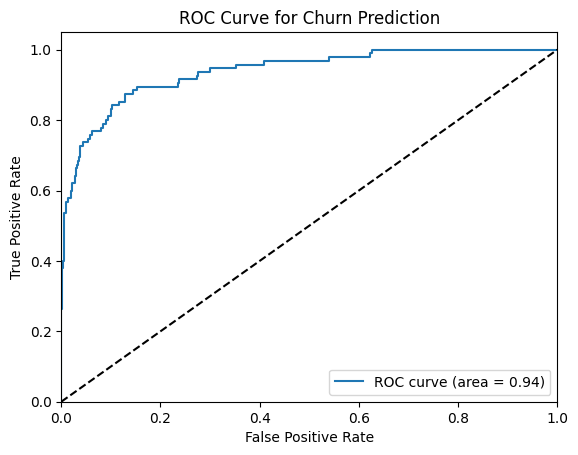

Best threshold (Youden's J): 0.143
At this point — TPR: 0.874, FPR: 0.129
J statistic: 0.744

Classification report for Support Vector Machine (Scaled) (Optimal Threshold):
               precision    recall  f1-score   support

           0       0.98      0.87      0.92       572
           1       0.53      0.87      0.66        95

    accuracy                           0.87       667
   macro avg       0.75      0.87      0.79       667
weighted avg       0.91      0.87      0.88       667



In [43]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

svm_scaled = SVC(C=1, kernel='rbf', probability=True, random_state=124, class_weight='balanced', gamma='scale')
svm_scaled.fit(X_train_scaled, y_train)

y_pred_svm_scaled = svm_scaled.predict(X_test_scaled)
y_pred_proba_svm_scaled = svm_scaled.predict_proba(X_test_scaled)[:, 1]

plot_metrics(y_test, y_pred_svm_scaled, y_pred_proba_svm_scaled, "Support Vector Machine (Scaled)")

Cross Validation

In [44]:
from sklearn.model_selection import cross_validate, cross_val_score

scoring = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
scores = cross_validate(lr, X_train, y_train, cv=5, scoring=scoring)

print(scores)

{'fit_time': array([0.01520967, 0.00928235, 0.00941443, 0.00867105, 0.00764346]), 'score_time': array([0.00685191, 0.0052135 , 0.00565147, 0.00570583, 0.00579786]), 'test_accuracy': array([0.86329588, 0.86116323, 0.84990619, 0.87429644, 0.85928705]), 'test_precision': array([0.59259259, 0.55555556, 0.44827586, 0.72      , 0.56      ]), 'test_recall': array([0.20512821, 0.19480519, 0.16883117, 0.23076923, 0.17948718]), 'test_f1': array([0.3047619 , 0.28846154, 0.24528302, 0.34951456, 0.27184466]), 'test_roc_auc': array([0.80502137, 0.75327523, 0.82686831, 0.83682728, 0.80853762])}


We will also try using Grid Search... We can try this for every model, if we need to. It's the same stuff, it just takes some extra time. 

c:\Users\lucia\Documents\coding stuff\data_analysis\venv\Lib\site-packages\sklearn\svm\_base.py:239: FutureWarning: The `probability` parameter was deprecated in 1.9 and will be removed in version 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`
  warnings.warn(


Best parameters found:  {'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}

Classification report for Best Support Vector Machine (Scaled):
               precision    recall  f1-score   support

           0       0.96      0.91      0.94       572
           1       0.59      0.79      0.68        95

    accuracy                           0.89       667
   macro avg       0.78      0.85      0.81       667
weighted avg       0.91      0.89      0.90       667



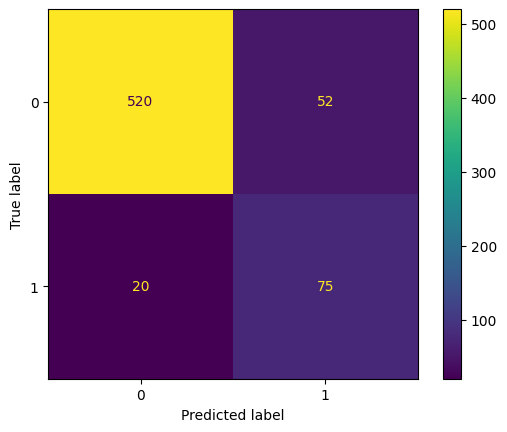

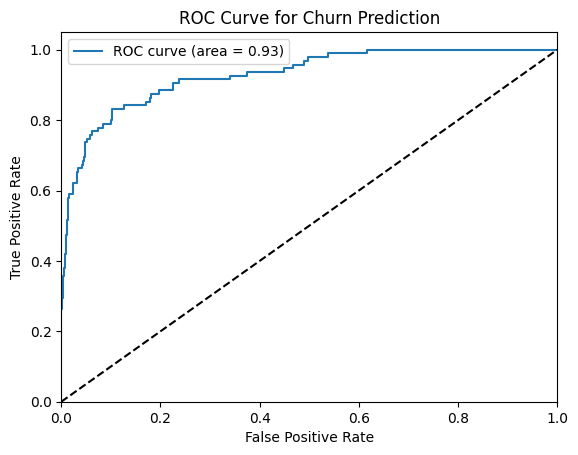

Best threshold (Youden's J): 0.169
At this point — TPR: 0.832, FPR: 0.103
J statistic: 0.728

Classification report for Best Support Vector Machine (Scaled) (Optimal Threshold):
               precision    recall  f1-score   support

           0       0.97      0.90      0.93       572
           1       0.57      0.83      0.68        95

    accuracy                           0.89       667
   macro avg       0.77      0.86      0.80       667
weighted avg       0.91      0.89      0.90       667



In [45]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['rbf', 'linear'],
    'gamma': ['scale', 'auto', 0.01, 0.1]
}

grid_search = GridSearchCV(SVC(probability=True, random_state=124, class_weight='balanced'), param_grid, cv=5, scoring='roc_auc', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train)

best_svm = grid_search.best_estimator_
print("Best parameters found: ", grid_search.best_params_)

y_pred_best_svm = best_svm.predict(X_test_scaled)
y_pred_proba_best_svm = best_svm.predict_proba(X_test_scaled)[:, 1]
plot_metrics(y_test, y_pred_best_svm, y_pred_proba_best_svm, "Best Support Vector Machine (Scaled)")

Precision/Recall trade-off: depends on the domain and use-case

- **High recall** = catch almost every customer who's about to leave (good — you don't lose them silently) but you'll also bother some loyal customers with retention offers they didn't need (false positives)
- **High precision** = only target customers you're very confident will churn, but you'll miss some real churners who slipped through (false negatives)

## Final Comparison

In [46]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc

models = {
    "Logistic Regression": (y_pred_lr, y_pred_proba_lr),
    "Random Forest": (y_pred_rf, y_pred_proba_rf),
    "Decision Tree": (y_pred_dt, y_pred_proba_dt),
    "K-Nearest Neighbors": (y_pred_knn, y_pred_proba_knn),
    "Support Vector Machine": (y_pred_svm_scaled, y_pred_proba_svm_scaled),
    "Support Vector Machine After Grid Search": (y_pred_best_svm, y_pred_proba_best_svm),
}

results = []

for name, (y_pred, y_pred_proba) in models.items():
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    
    results.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1 Score": f1_score(y_test, y_pred),
        "ROC AUC": roc_auc
    })

results_df = pd.DataFrame(results).set_index("Model")
results_df = results_df.round(2)
results_df

,Accuracy,Precision,Recall,F1 Score,ROC AUC
Model,,,,,
Logistic Regression,0.86,0.52,0.16,0.24,0.81
Random Forest,0.98,1.00,0.85,0.92,0.94
Decision Tree,0.98,0.97,0.87,0.92,0.93
K-Nearest Neighbors,0.87,0.70,0.17,0.27,0.67
Support Vector Machine,0.89,0.59,0.80,0.68,0.94
Support Vector Machine After Grid Search,0.89,0.59,0.79,0.68,0.93
